# 07 Linking TPI with Canny Edges

Ryan E Lima [](https://orcid.org/0000-0002-5352-7215)

**Scientific Validity**

**TPI Analysis:** Using TPI to highlight features such as ridges and valleys is a well-established method. Varying neighborhood sizes will help capture features at different spatial scales.

**Edge Detection:** Applying the Canny edge detection algorithm on various rasters (DEM, hillshade, TPI) is valid for highlighting discontinuities that may indicate geological features, such as faults and lineaments.

**Previous Studies**

find

**Validation**

-   After generating edge-detected features, validation is key. Compare your results with known geological maps, aerial imagery, or field observations to assess accuracy.

-   Metrics like precision, recall, and overall accuracy can quantify the effectiveness of different approaches.

## Approach Refinement

Hillshade Consideration: A multi-directional hillshade will capture more nuanced terrain features than a single-directional one. Ensure you apply it at appropriate sun angles.

DEM Smoothing: Your workflow smooths the DEM with a small 3x3 kernel before applying the neighborhood filters for TPI. This is reasonable but monitor if excessive smoothing removes critical small-scale features.

Edge Detection Parameters: Thresholds in Canny edge detection can significantly impact results. Consider automating threshold optimization (e.g., using Otsu’s method) for consistency across rasters.

## This notebook attempts to:

-   Apply edge detection on all TPI results, the DEM, and the hillshade, then compare outputs visually and quantitatively.

-   Experiment with additional derivatives like slope and curvature for comparison.

-   Integrate all detected edges into a single dataset, possibly weighting edges from different inputs, and evaluate which raster contributes most to feature detection.

# Workflow

## 00 Load Libraries

In [17]:
import os
import numpy as np
import cv2
import rasterio
import matplotlib.pyplot as plt
from skimage import exposure
from pyproj import CRS
import requests
from scipy.ndimage import convolve


## 01 Download and Load DEM

In [9]:
# Step 1: Download and Load DEM
DEM_URL = 'https://prd-tnm.s3.amazonaws.com/StagedProducts/Elevation/1/TIFF/historical/n35w112/USGS_1_n35w112_20240402.tif'
dem_path = 'Data/USGS_1_n35w112_20240402.tif'

if not os.path.exists(dem_path):
    print("Downloading DEM...")
    response = requests.get(DEM_URL, stream=True)
    with open(dem_path, 'wb') as file:
        for chunk in response.iter_content(chunk_size=8192):
            file.write(chunk)
    print("Download complete.")

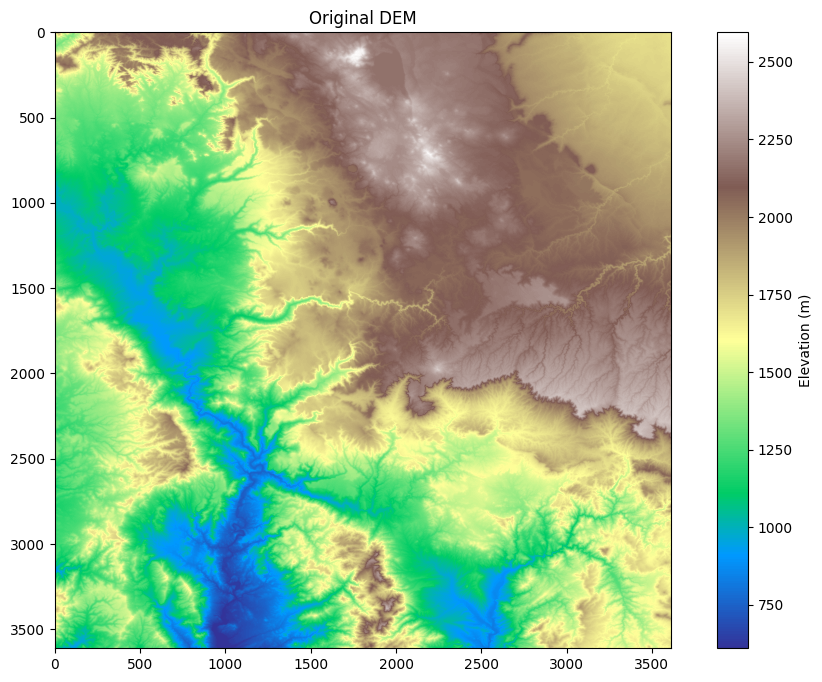

In [10]:
# Load DEM
with rasterio.open(dem_path) as src:
    dem = src.read(1)
    profile = src.profile
    transform = src.transform

# Plot original DEM
plt.figure(figsize=(12, 8))
plt.title("Original DEM")
plt.imshow(dem, cmap='terrain')
plt.colorbar(label='Elevation (m)')
plt.show()

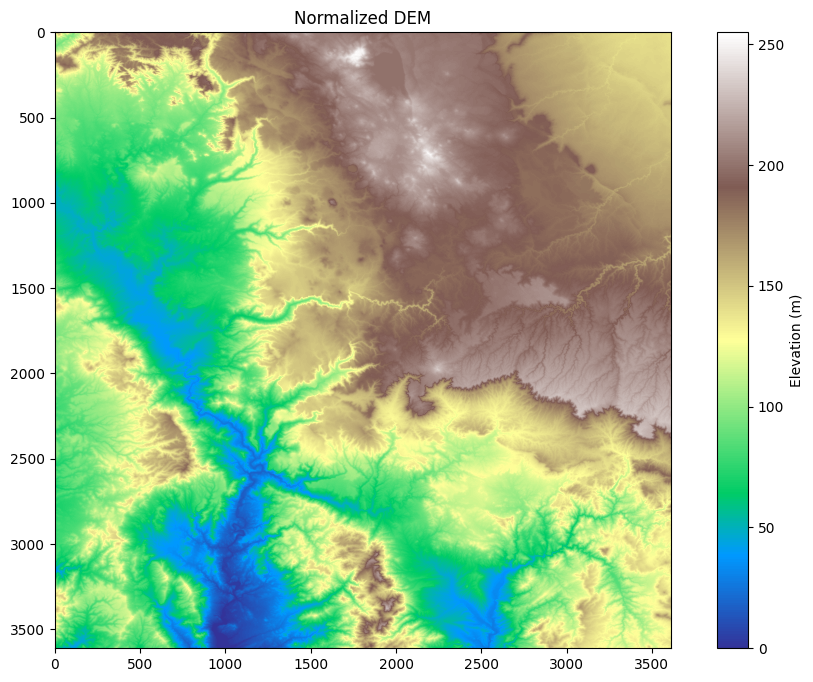

In [11]:
# Normalize DEM
dem_normalized = cv2.normalize(dem, None, 0, 255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

# plot normalized dem 
plt.figure(figsize=(12, 8))
plt.title("Normalized DEM")
plt.imshow(dem_normalized, cmap='terrain')
plt.colorbar(label='Elevation (m)')
plt.show()



## 02 Create neighborhood and TPI Calculation

In [12]:
def create_neighborhood(shape='circle', size=5):
    if shape == 'square':
        return np.ones((size, size))
    elif shape == 'circle':
        y, x = np.ogrid[-size//2:size//2+1, -size//2:size//2+1]
        return (x**2 + y**2) <= (size//2)**2
    else:
        raise ValueError("Invalid shape. Choose 'square' or 'circle'.")


In [13]:
def apply_filter(dem, footprint, filter_type='mean'):
    if filter_type == 'mean':
        return convolve(dem, footprint / footprint.sum(), mode='constant', cval=np.nan)
    elif filter_type in ['median', 'max', 'min']:
        filter_funcs = {'median': np.nanmedian, 'max': np.nanmax, 'min': np.nanmin}
        return generic_filter(dem, filter_funcs[filter_type], footprint=footprint, mode='constant', cval=np.nan)
    else:
        raise ValueError("Invalid filter type.")

In [14]:
def calculate_tpi(original_dem, filtered_dem):
    return original_dem - filtered_dem

def generate_tpi(dem, sizes, shape='circle'):
    tpi_rasters = {}
    for size in sizes:
        footprint = create_neighborhood(shape=shape, size=size)
        filtered_dem = apply_filter(dem, footprint, filter_type='mean')
        tpi = calculate_tpi(dem, filtered_dem)
        tpi_rasters[size] = tpi
    return tpi_rasters

In [29]:
sizes = [5,10,25,40,50, 75]  # Neighborhood sizes for TPI
tpi_rasters = generate_tpi(dem, sizes)

In [52]:
def plot_multiple_dems(dem_list, titles, cmap='Greys_r', clip_percentiles=(1, 99), equalize_hist=True):
    """
    Plots multiple DEMs in a grid layout.

    Parameters:
        dem_list (list): List of DEMs to be plotted (numpy arrays).
        titles (list): List of titles for each DEM, must match the length of dem_list.
        cmap (str): Colormap for the plots.
        clip_percentiles (tuple): Percentiles for clipping (e.g., (1, 99)).
        equalize_hist (bool): Whether to apply histogram equalization.

    Returns:
        None: Displays the plots.
    """
    num_dems = len(dem_list)
    cols = 3  # Number of columns in the grid
    rows = (num_dems + cols - 1) // cols  # Calculate rows dynamically
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    axes = axes.flatten()  # Flatten axes for easier indexing
    
    for i, (dem, title) in enumerate(zip(dem_list, titles)):
        vmin = np.nanpercentile(dem, clip_percentiles[0])
        vmax = np.nanpercentile(dem, clip_percentiles[1])
        dem_clipped = np.clip(dem, vmin, vmax)
        dem_no_nan = np.nan_to_num(dem_clipped, nan=vmin)
        
        if equalize_hist:
            dem_eq = exposure.equalize_hist(dem_no_nan) * 255
            axes[i].imshow(dem_eq, cmap=cmap)
        else:
            axes[i].imshow(dem_no_nan, cmap=cmap, vmin=vmin, vmax=vmax)
        
        axes[i].set_title(f"{title}")
        axes[i].axis('off')
    
    # Hide empty axes
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

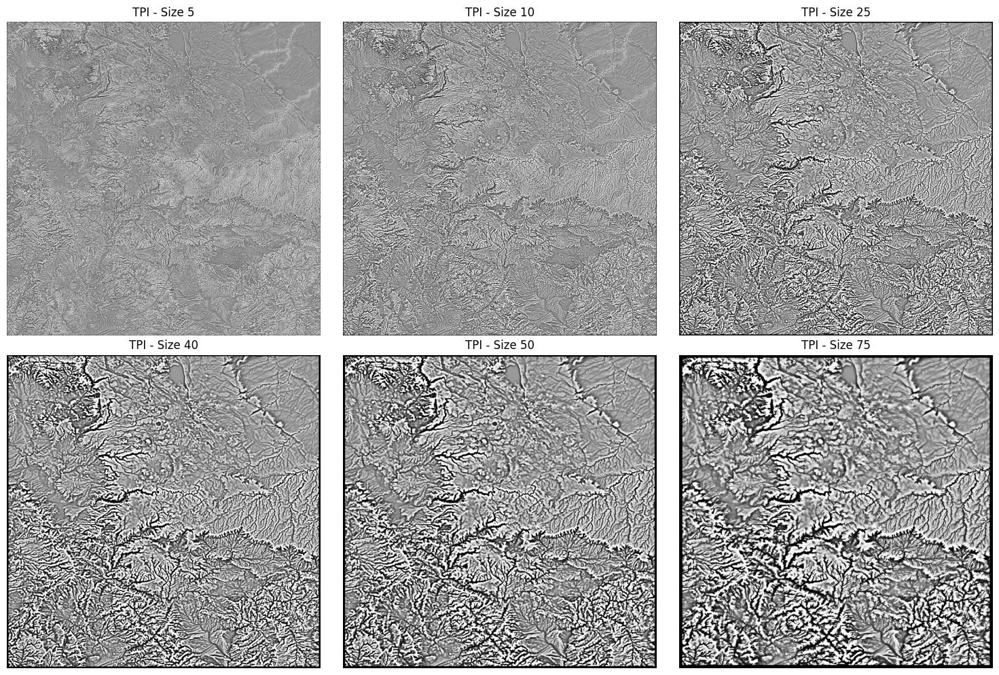

In [53]:
# Prepare DEMs and titles
dem_list = [tpi_rasters[size] for size in sizes]
titles = [f"TPI - Size {size}" for size in sizes]

# Call the function
plot_multiple_dems(dem_list, titles)

### Results of TPI analysis

It appears that TPI does a very good job at highlighting small landscape features, at smaller neighborhood sizes it finds more detail but the contrast is less, while at larger neighborhoods the smaller details get a bit blurred while the contrast is rampped up.

Try looking at these without histogram equalization and using cmaps: ‘Greys_r’ and ‘Viridis’

## 03 Generate Multi-directional Hillshade

In [50]:
def generate_hillshade(dem, azimuth, altitude):
    """
    Generate hillshade from DEM for a given azimuth and altitude.
    
    Parameters:
        dem (numpy array): The input DEM.
        azimuth (float): Azimuth angle of illumination (degrees).
        altitude (float): Altitude angle of illumination (degrees).

    Returns:
        numpy array: Hillshade raster.
    """
    x, y = np.gradient(dem)  # Calculate gradients in x and y directions
    slope = np.pi / 2 - np.arctan(np.sqrt(x**2 + y**2))  # Slope in radians
    aspect = np.arctan2(-x, y)  # Aspect in radians

    azimuth_rad = np.deg2rad(azimuth)
    altitude_rad = np.deg2rad(altitude)

    # Illumination model
    shaded = (
        np.sin(altitude_rad) * np.sin(slope) +
        np.cos(altitude_rad) * np.cos(slope) * np.cos(azimuth_rad - aspect)
    )
    return np.clip(shaded, 0, 1)  # Ensure values are between 0 and 1

def generate_hillshades(dem, azimuths=[45, 135, 225, 315], altitude=30, stat='all'):
    """
    Generate combined hillshades using mean, max, or median statistics.

    Parameters:
        dem (numpy array): The input DEM.
        azimuths (list): List of azimuth angles for hillshade generation.
        altitude (float): Altitude angle of illumination (degrees).
        stat (str): Statistic to apply ('mean', 'max', 'median', or 'all').

    Returns:
        dict: A dictionary with hillshade statistics as keys and arrays as values.
    """
    hillshade_stack = [generate_hillshade(dem, azimuth, altitude) for azimuth in azimuths]

    # Calculate statistics
    results = {}
    if stat in ['mean', 'all']:
        results['mean'] = np.mean(hillshade_stack, axis=0)
    if stat in ['max', 'all']:
        results['max'] = np.max(hillshade_stack, axis=0)
    if stat in ['median', 'all']:
        results['median'] = np.median(hillshade_stack, axis=0)

    return results

def plot_hillshades(hillshades, cmap='Greys'):
    """
    Plot multiple hillshade results.

    Parameters:
        hillshades (dict): Dictionary of hillshade results with keys as labels.
        cmap (str): Colormap for plotting.

    Returns:
        None: Displays the plots.
    """
    keys = list(hillshades.keys())
    n = len(keys)
    
    fig, axes = plt.subplots(1, n, figsize=(5 * n, 8))
    for i, key in enumerate(keys):
        ax = axes[i]
        ax.imshow(hillshades[key], cmap=cmap)
        ax.set_title(f"Hillshade ({key})")
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

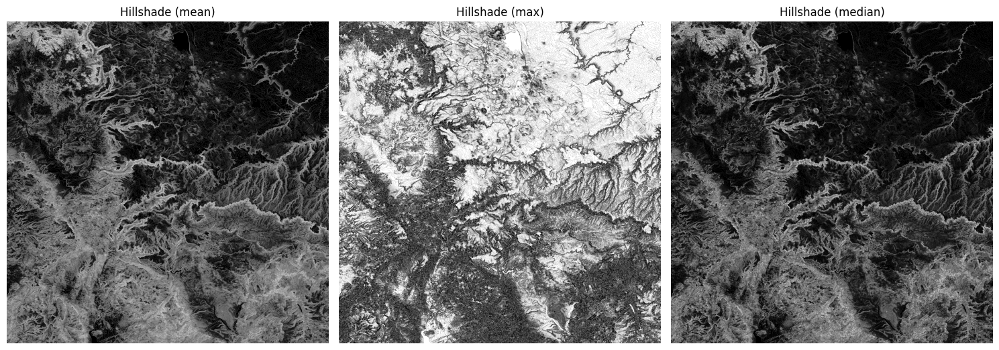

In [51]:
# Generate all hillshade statistics
hillshade_stats = generate_hillshades(dem_normalized, azimuths=[45, 135, 225, 315], altitude=30, stat='all')

# Plot the results
plot_hillshades(hillshade_stats)

### Hillshade results

Multi-directional hillshade appears to work very well at pulling out landscape detail as well, particularly the mean and max, and they work better on the normalized dem than the un-normalize dem.

## 04 Canny Edge Detection

In [63]:
#  Canny Edge Detection
def apply_canny_edge_detection(data, threshold1, threshold2, aperture_size=3):
    """
    Apply Canny edge detection to a raster.

    Parameters:
        data (numpy array): Input raster data.
        threshold1 (float): Lower threshold for edge detection.
        threshold2 (float): Upper threshold for edge detection.
        aperture_size (int): Aperture size for the Sobel operator.

    Returns:
        numpy array: Edges detected in the input raster.
    """
    edges = cv2.Canny(data, threshold1, threshold2, apertureSize=aperture_size)
    return edges

def test_canny_parameters(raster, thresholds, aperture_sizes):
    """
    Test different Canny edge detection parameters on a raster.

    Parameters:
        raster (numpy array): Input raster (should be normalized to uint8).
        thresholds (list of tuples): List of (threshold1, threshold2) pairs.
        aperture_sizes (list): List of aperture sizes to test.

    Returns:
        None: Displays the results as a grid of plots.
    """
    raster_uint8 = normalize_to_uint8(raster)  # Ensure raster is uint8
    results = []
    param_combinations = []

    for threshold1, threshold2 in thresholds:
        for aperture_size in aperture_sizes:
            edges = apply_canny_edge_detection(raster_uint8, threshold1, threshold2, aperture_size)
            results.append(edges)
            param_combinations.append(f"T1={threshold1}, T2={threshold2}, Aperture={aperture_size}")

    # Plot results
    n = len(results)
    cols = 3  # Number of columns
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    axes = axes.flatten()

    for i, (result, params) in enumerate(zip(results, param_combinations)):
        ax = axes[i]
        ax.imshow(result, cmap='gray')
        ax.set_title(params)
        ax.axis('off')

    # Hide unused axes
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()  


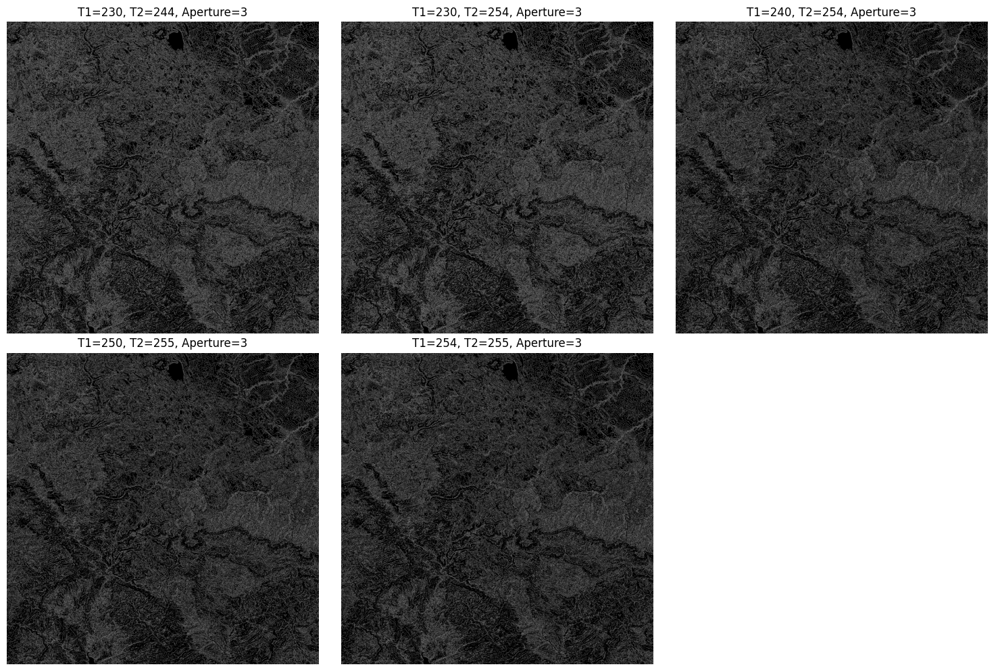

In [81]:
# Define thresholds and aperture sizes to test
thresholds_to_test = [(230,244),(230,254),(240,254),(250,255), (254,255)]
aperture_sizes_to_test = [3]

# Test Canny parameters on the mean hillshade
test_canny_parameters(hillshade_stats['mean'], thresholds_to_test, aperture_sizes_to_test)

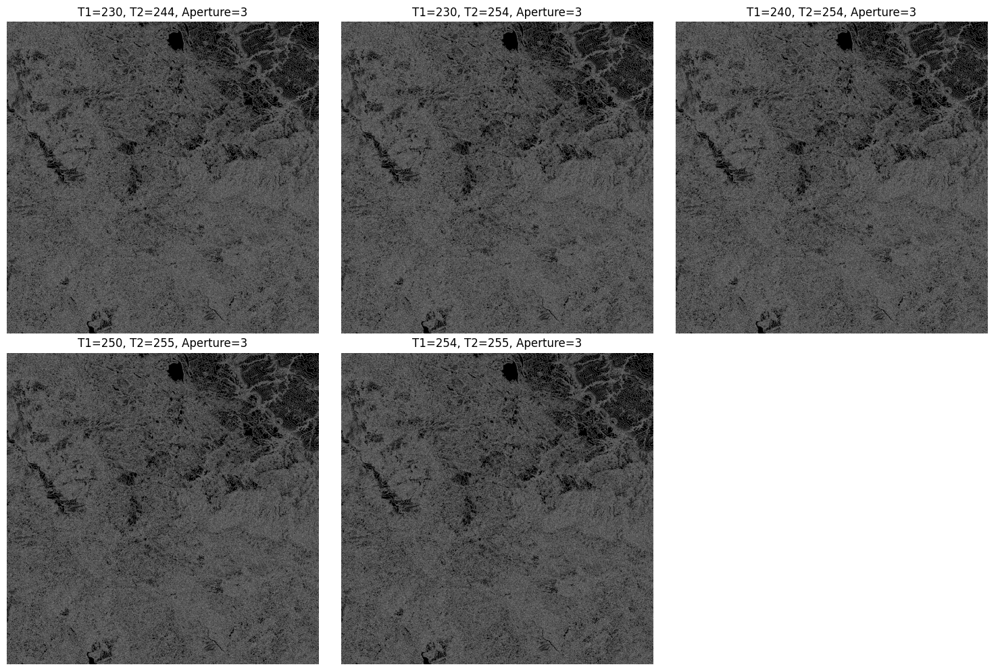

In [82]:
# Test Canny parameters on the max hillshade
test_canny_parameters(hillshade_stats['max'], thresholds_to_test, aperture_sizes_to_test)

In [83]:
# canny edge detector requires input data that is 8-bit unsigned interger, though the dem is probably a float32 so we need to create a function that converts the data to uint8

# Normalize and convert to uint8 for Canny edge detection
def normalize_to_uint8(data):
    """
    Normalize a raster to the range [0, 255] and convert to uint8.
    
    Parameters:
        data (numpy array): Input raster data.

    Returns:
        numpy array: Normalized raster data as uint8.
    """
    data_normalized = cv2.normalize(data, None, 0, 255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    return data_normalized

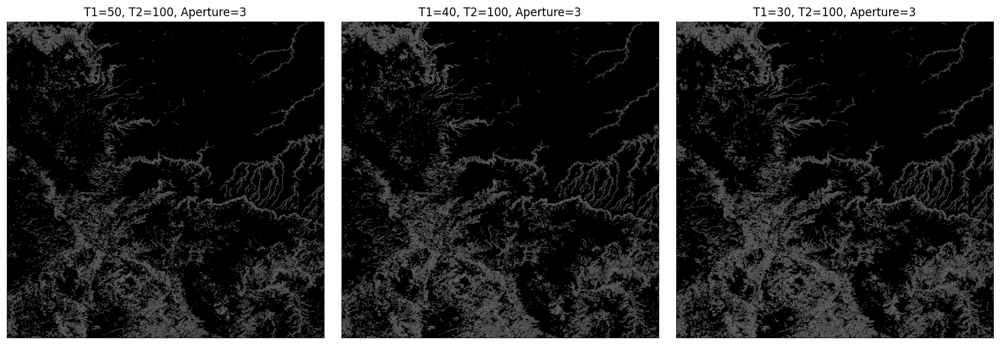

In [97]:
# now we run tests to see the best canny paramters for TPI

tpi10 = normalize_to_uint8(tpi_rasters[10])


thresholds_to_test = [(50,100),(40,100),(30,100)]
aperture_sizes_to_test = [3]

test_canny_parameters(tpi10, thresholds_to_test, aperture_sizes_to_test)

In [99]:
# SO it seems the TPI needs lower thresholds than the multi-directional hillshade but what if we combine the TPI and multi-dimensional hillshade?

def combine_rasters(raster1, raster2, method='mean'):
    """
    Combine two rasters using a specified method (mean, median, or max).

    Parameters:
        raster1 (numpy array): First input raster (e.g., Hillshade Max).
        raster2 (numpy array): Second input raster (e.g., Normalized TPI).
        method (str): Combination method ('mean', 'median', 'max').

    Returns:
        numpy array: Combined raster.
    """
    if method == 'mean':
        return np.nanmean(np.array([raster1, raster2]), axis=0)
    elif method == 'median':
        return np.nanmedian(np.array([raster1, raster2]), axis=0)
    elif method == 'max':
        return np.nanmax(np.array([raster1, raster2]), axis=0)
    else:
        raise ValueError("Invalid method. Choose 'mean', 'median', or 'max'.")



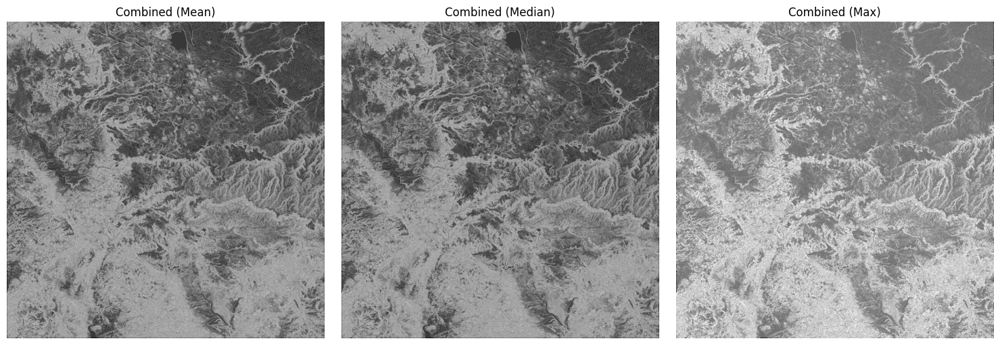

In [100]:
# Normalize rasters to uint8
hillshade_max_normalized = normalize_to_uint8(hillshade_stats['max'])
tpi10_normalized = normalize_to_uint8(tpi_rasters[10])

# Combine using different methods
combined_mean = combine_rasters(hillshade_max_normalized, tpi10_normalized, method='mean')
combined_median = combine_rasters(hillshade_max_normalized, tpi10_normalized, method='median')
combined_max = combine_rasters(hillshade_max_normalized, tpi10_normalized, method='max')

# Plot results
def plot_combined_results(combined_rasters, methods):
    """
    Plot combined raster results for different methods.

    Parameters:
        combined_rasters (list): List of combined rasters.
        methods (list): List of method names corresponding to the rasters.

    Returns:
        None: Displays the plots.
    """
    fig, axes = plt.subplots(1, len(combined_rasters), figsize=(15, 5))
    for ax, raster, method in zip(axes, combined_rasters, methods):
        ax.imshow(raster, cmap='gray')
        ax.set_title(f"Combined ({method})")
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Plot all combinations
plot_combined_results(
    [combined_mean, combined_median, combined_max],
    ['Mean', 'Median', 'Max']
)

In [ ]:
# hmm that seems to reduce contrast which is not what we want for crisp edges. lets try to increase contrast with thresholding on the TPI

In [102]:
def apply_threshold(raster, lower_threshold, upper_threshold):
    """
    Apply binary thresholding to a raster.
    
    Parameters:
        raster (numpy array): Input raster.
        lower_threshold (float): Minimum value to include (everything below becomes 0).
        upper_threshold (float): Maximum value to include (everything above becomes 255).

    Returns:
        numpy array: Thresholded raster.
    """
    thresholded = np.where((raster >= lower_threshold) & (raster <= upper_threshold), 255, 0)
    return thresholded.astype(np.uint8)

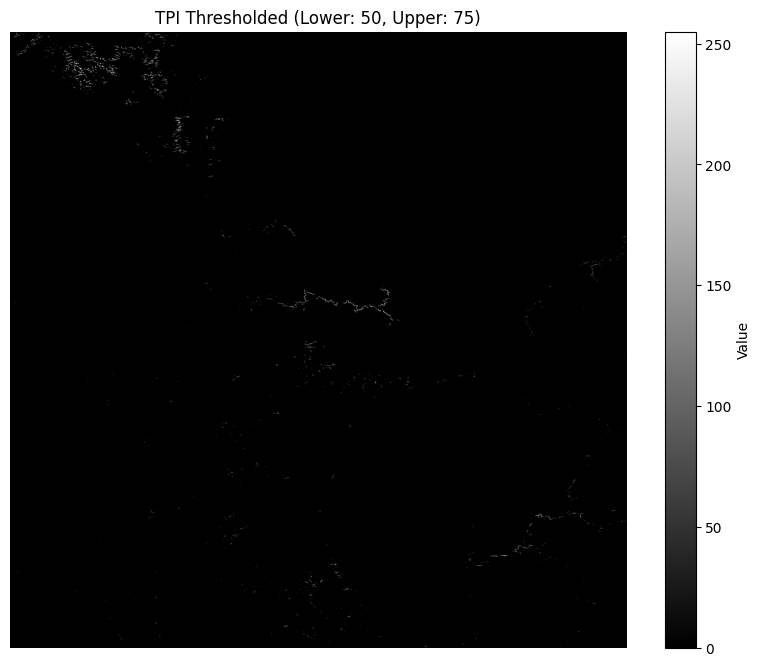

In [104]:
# Set thresholds
lower_threshold = 50
upper_threshold = 75

# Apply thresholding to TPI raster (e.g., TPI for size 10)
tpi10_normalized = normalize_to_uint8(tpi_rasters[10])
tpi10_thresholded = apply_threshold(tpi10_normalized, lower_threshold, upper_threshold)

# Plot the result
plt.figure(figsize=(10, 8))
plt.title(f"TPI Thresholded (Lower: {lower_threshold}, Upper: {upper_threshold})")
plt.imshow(tpi10_thresholded, cmap='gray')
plt.axis('off')
plt.colorbar(label='Value')
plt.show()

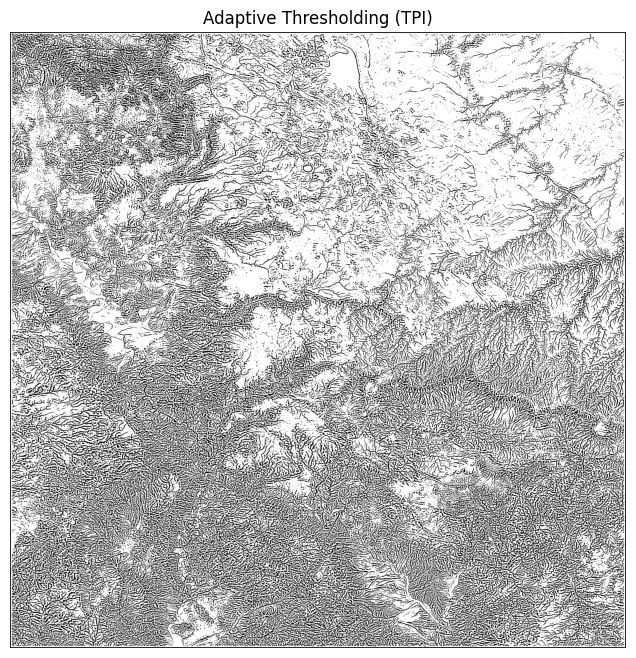

In [109]:
import cv2

tpi10_adaptive = cv2.adaptiveThreshold(
    tpi10_normalized, 
    255, 
    cv2.ADAPTIVE_THRESH_MEAN_C, 
    cv2.THRESH_BINARY, 
    blockSize=15, 
    C=2
)

# Plot the adaptive thresholded TPI
plt.figure(figsize=(10, 8))
plt.title("Adaptive Thresholding (TPI)")
plt.imshow(tpi10_adaptive, cmap='gray')
plt.axis('off')
plt.show()

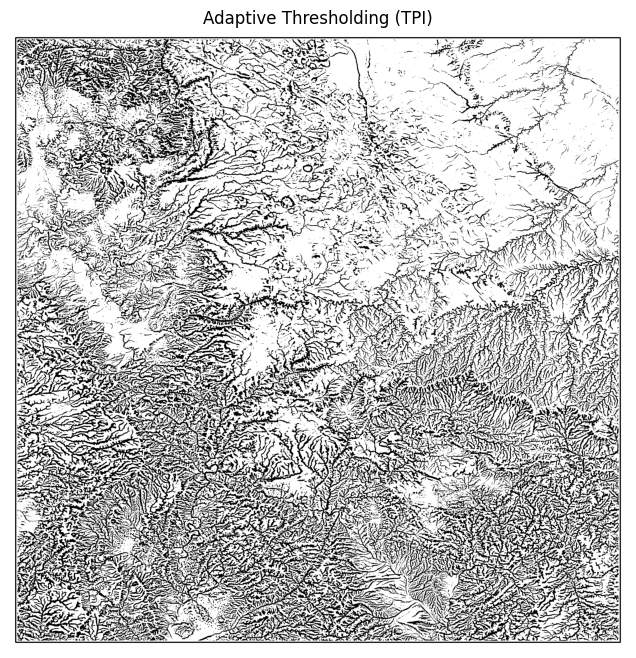

In [110]:
tpi75_normalized = normalize_to_uint8(tpi_rasters[75])

tpi75_adaptive = cv2.adaptiveThreshold(
    tpi75_normalized, 
    255, 
    cv2.ADAPTIVE_THRESH_MEAN_C, 
    cv2.THRESH_BINARY, 
    blockSize=15, 
    C=2
)

# Plot the adaptive thresholded TPI
plt.figure(figsize=(10, 8))
plt.title("Adaptive Thresholding (TPI)")
plt.imshow(tpi75_adaptive, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
# it seems like applying an adaptive threshold to a TPI 75 does a good job of thinning the lines and increasing contrast which might really improve results in pCI geomatica. 

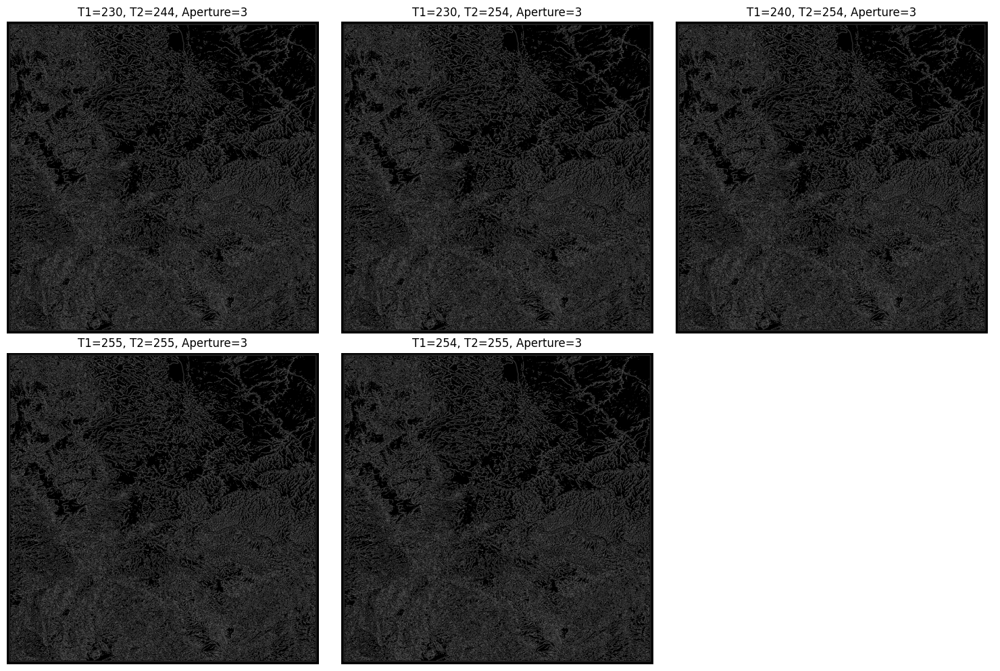

In [112]:

thresholds_to_test = [(230,244),(230,254),(240,254),(255,255), (254,255)]
aperture_sizes_to_test = [3]

# Test Canny parameters on the mean hillshade
test_canny_parameters(tpi75_adaptive, thresholds_to_test, aperture_sizes_to_test)

In [92]:
# Initialize Canny edge detection results
canny_results = {}


# set threshold values

# Parameters for Canny Edge Detection
threshold1 = 100
threshold2 = 200
aperture_size = 3

# Apply Canny Edge Detection
canny_results['raw_dem'] = apply_canny_edge_detection(normalize_to_uint8(dem), threshold1, threshold2, aperture_size)

# Apply edge detection on all hillshade statistics
for stat, hillshade in hillshade_stats.items():
    canny_results[f'hillshade_{stat}'] = apply_canny_edge_detection(
        cv2.normalize(hillshade, None, 0, 255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U),
        threshold1,
        threshold2,
        aperture_size
    )

# Apply edge detection on all TPI results
for size, tpi in tpi_rasters.items():
    tpi_normalized = cv2.normalize(tpi, None, 0, 255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    canny_results[f'tpi_{size}'] = apply_canny_edge_detection(tpi_normalized, threshold1, threshold2, aperture_size)

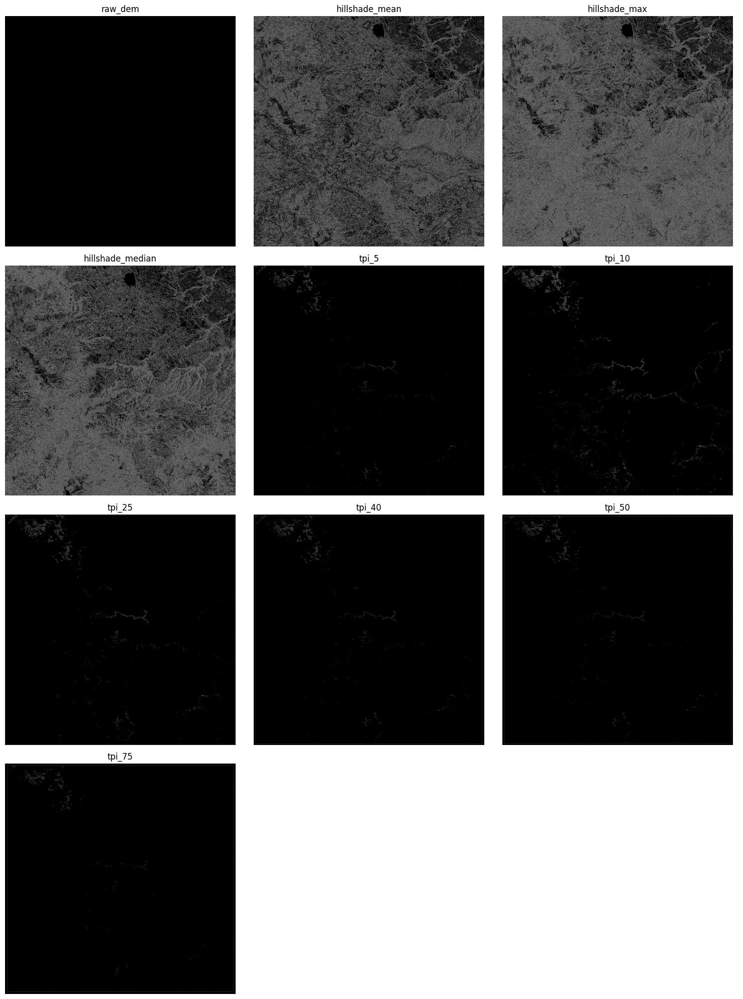

In [91]:
def plot_canny_results(canny_results, cmap='gray'):
    """
    Plot edge detection results for comparison.

    Parameters:
        canny_results (dict): Dictionary of edge detection results with keys as labels.
        cmap (str): Colormap for the plots.

    Returns:
        None: Displays the plots.
    """
    keys = list(canny_results.keys())
    n = len(keys)
    cols = 3  # Number of columns for the plot grid
    rows = (n + cols - 1) // cols  # Calculate rows dynamically

    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    axes = axes.flatten()

    for i, key in enumerate(keys):
        ax = axes[i]
        ax.imshow(canny_results[key], cmap=cmap)
        ax.set_title(f"{key}")
        ax.axis('off')

    # Hide unused axes
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Plot all Canny edge detection results
plot_canny_results(canny_results)

In [ ]:
## exporting rasters

In [113]:
import rasterio
from rasterio.transform import from_origin

def export_raster(output_path, raster_data, reference_raster_path, crs="EPSG:6341"):
    """
    Export a raster to a GeoTIFF file with georeferencing.

    Parameters:
        output_path (str): Path to save the output GeoTIFF.
        raster_data (numpy array): The raster data to export.
        reference_raster_path (str): Path to a reference raster for georeferencing (e.g., DEM).
        crs (str): Coordinate reference system (e.g., "EPSG:6341" for NAD 83 2011 UTM Zone 12N).

    Returns:
        None: Saves the GeoTIFF to the specified path.
    """
    # Open the reference raster to get transform and resolution
    with rasterio.open(reference_raster_path) as ref:
        transform = ref.transform
        profile = ref.profile
        dtype = raster_data.dtype  # Ensure correct data type for writing
    
    # Update the profile for the new raster
    profile.update({
        'dtype': dtype,
        'count': 1,
        'crs': crs,
        'transform': transform,
        'nodata': 0  # Set nodata value, if applicable
    })
    
    # Write the raster to GeoTIFF
    with rasterio.open(output_path, 'w', **profile) as dst:
        dst.write(raster_data, 1)  # Write data to the first band
    print(f"Raster exported to: {output_path}")

In [114]:
# Path to save the output raster
output_tpi_path = "Data/TPI75_adaptive_threshold.tif"
dem_path = 'Data/USGS_1_n35w112_20240402.tif'

# Export the thresholded TPI raster
export_raster(output_tpi_path, tpi75_adaptive, dem_path)

Raster exported to: Data/TPI75_adaptive_threshold.tif